In [1]:
import xarray as xr
import numpy as np
import numpy as np
import xarray as xr
import os
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd

In [42]:
import xarray as xr
ds = xr.open_dataset("/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/ACCESS-CM2_1x1grid/historical/solar_power_1980.nc")
# e.g. for Winter months Dec/Jan/Feb of *that* year:
# 2) Select the winter months (Dec, Jan, Feb) and sum over time
win = ds["specific generation"].sel(time=ds.time.dt.month.isin([12, 1, 2])).sum(dim="time")

# 3) Count how many grid cells are exactly zero
#    We sum over the spatial dims (y and x) to get a single integer
n_zero = int((win == 0).sum(dim=["y", "x"]).values)

print(f"{n_zero} grid cells are zero in that year’s winter")

550 grid cells are zero in that year’s winter


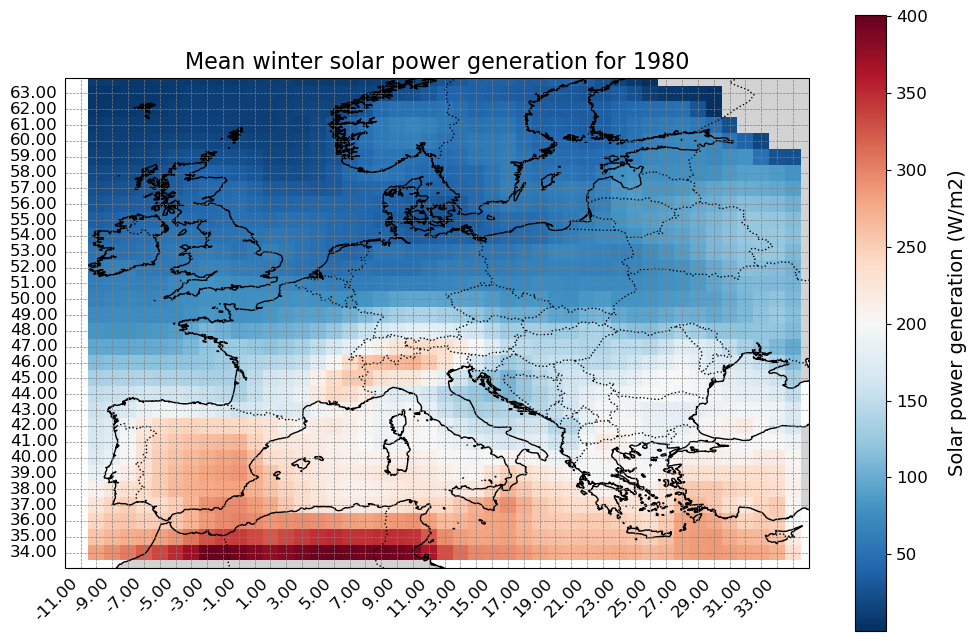

In [18]:
from plots import map_plots
map_plots(win, cmap="RdBu_r", title="Mean winter solar power generation for 1980", label="Solar power generation (W/m2)", vmin=None, vmax=None)

/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/ACCESS-CM2_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CanESM5_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CMCC-CM2-SR5_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CMCC-ESM2_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/HadGEM3-GC31-LL_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/HadGEM3-GC31-MM_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/MRI-ESM2-0_1x1grid/historical/


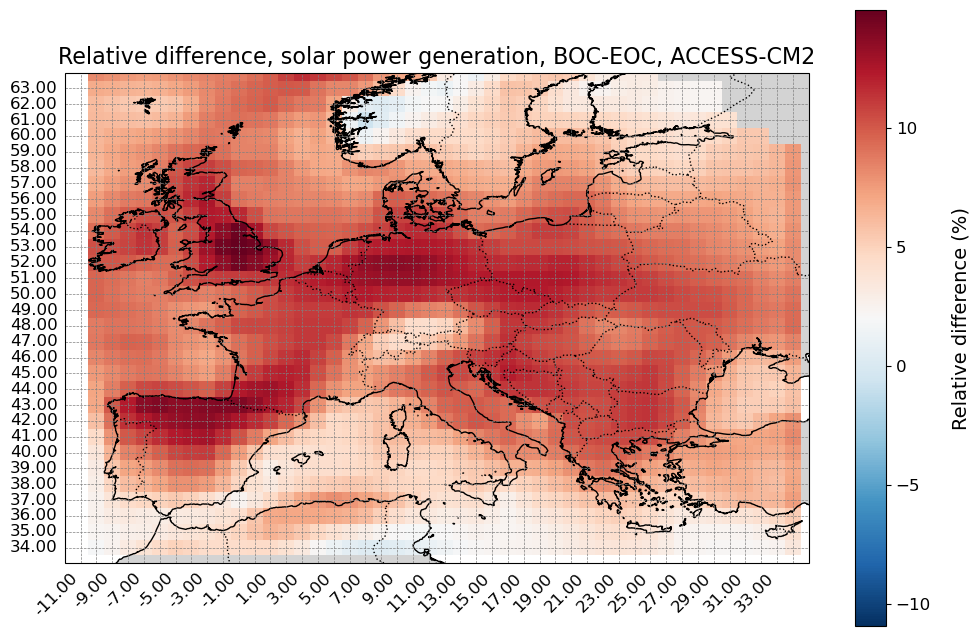

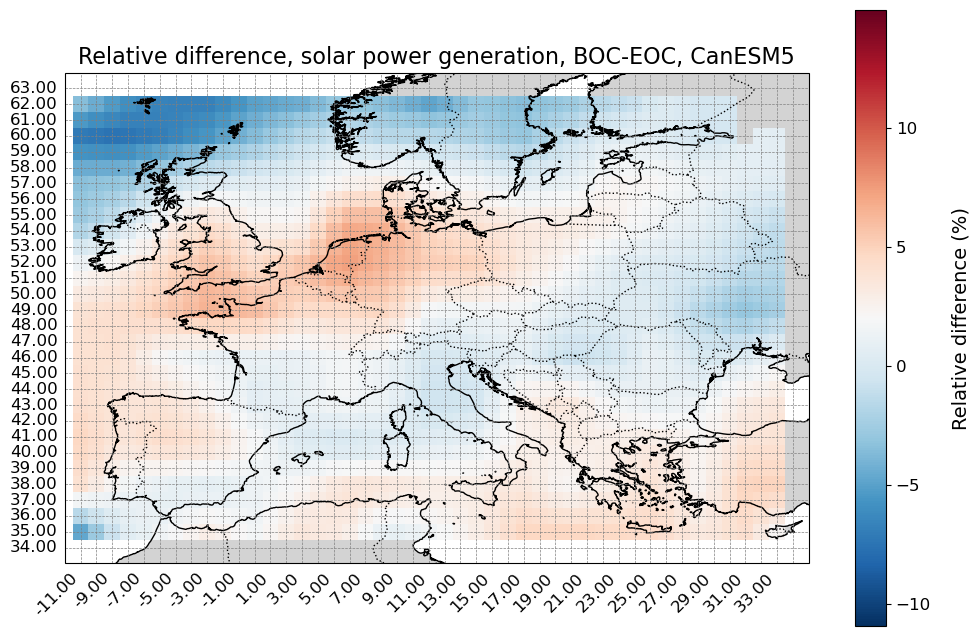

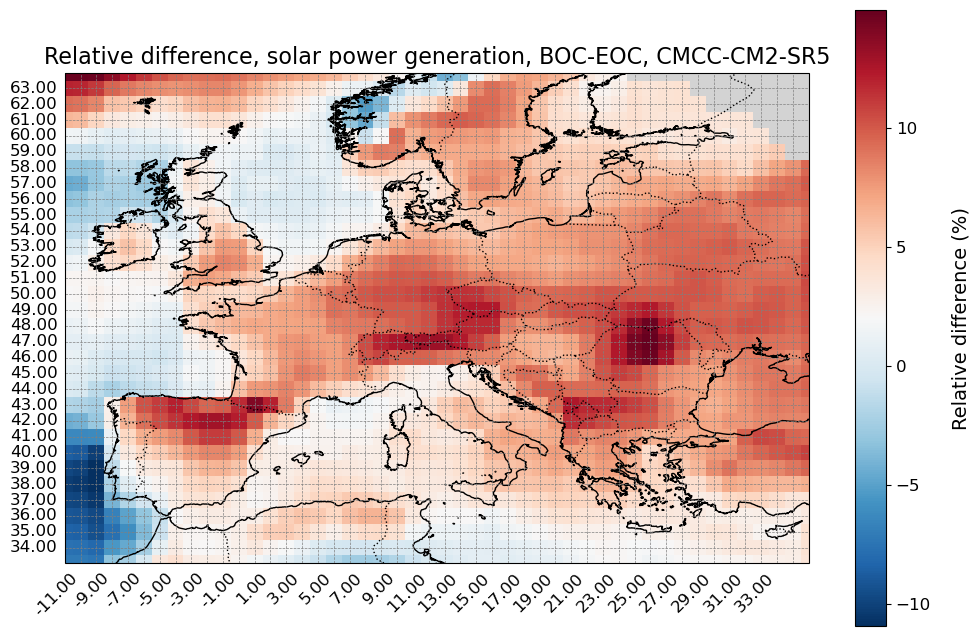

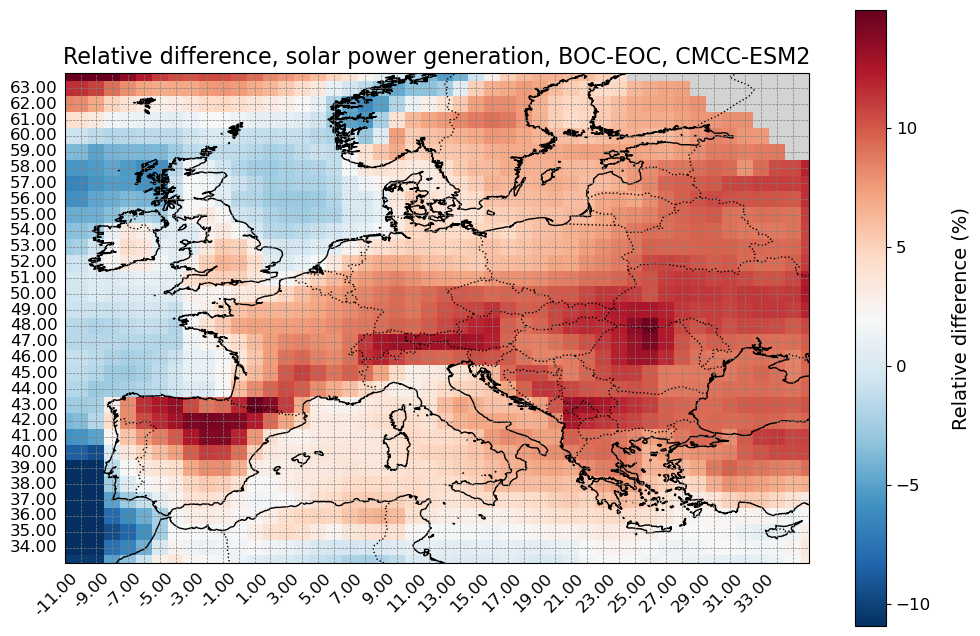

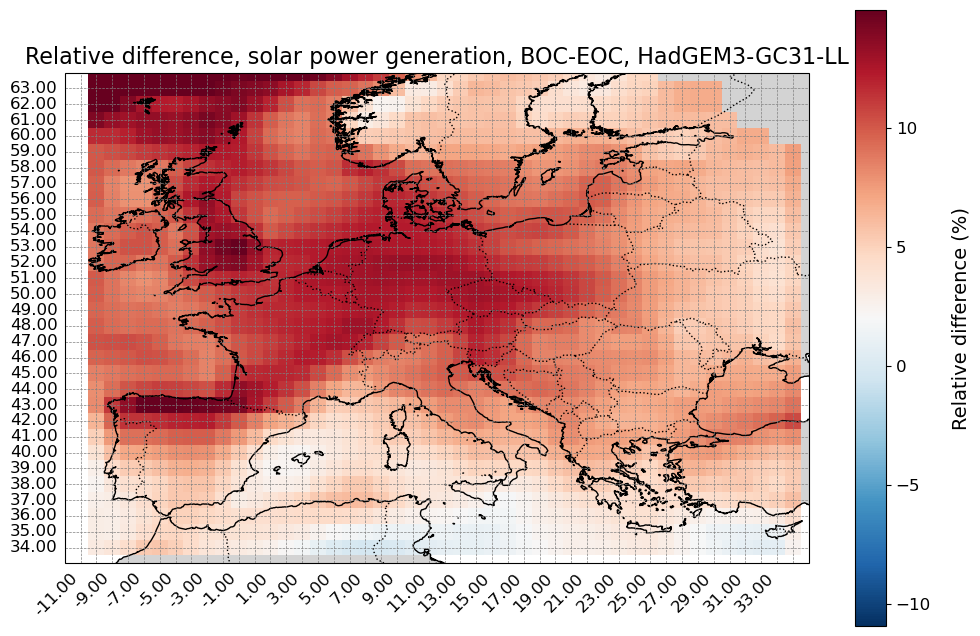

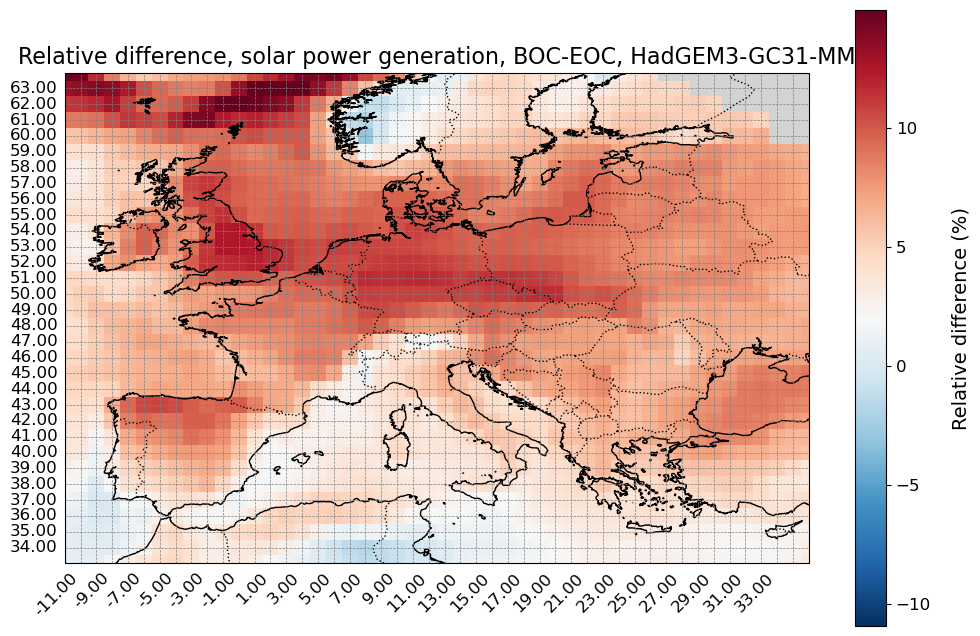

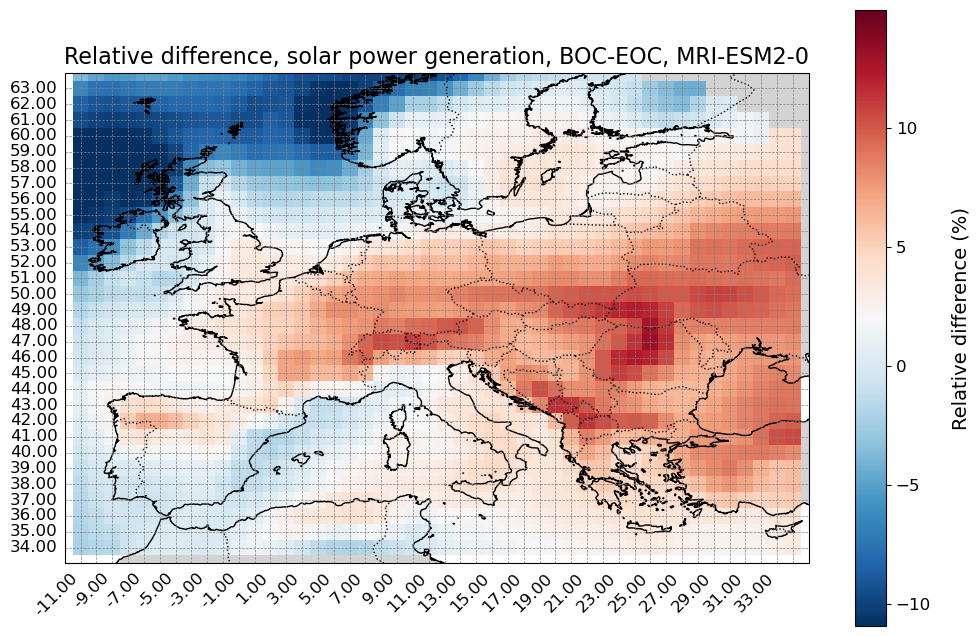

In [2]:
# Define the directory and models
models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2","HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]  # Replace with actual model names
diri = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"

# Initialize vmin and vmax
vmin = float("inf")
vmax = float("-inf")

# Dictionary to store relative differences for each model
relative_differences = {}
all_relative_differences = []

# Loop through each model
for model in models:
    # Define paths for BOC and EOC
    path_BOC = os.path.join(diri, model+"_1x1grid/historical/")
    print(path_BOC)
    path_EOC = os.path.join(diri, model+"_1x1grid/ssp585/")
    
    # Load BOC files
    files_BOC = [f"{path_BOC}aggregated_solar_power_{year}.nc" for year in range(1980, 2015)]
    datasets_BOC = []
    for year, file in zip(range(1980, 2015), files_BOC):
        ds_BOC = xr.open_dataset(file, engine="netcdf4")
        ds_BOC = ds_BOC.expand_dims(time=[year])
        datasets_BOC.append(ds_BOC)
    combined_ds_BOC = xr.concat(datasets_BOC, dim="time")
    mean_power_BOC = combined_ds_BOC["specific generation"].mean(dim="time")
    
    # Load EOC files
    files_EOC = [f"{path_EOC}aggregated_solar_power_{year}.nc" for year in range(2065, 2100)]
    datasets_EOC = []
    for year, file in zip(range(2065, 2100), files_EOC):
        ds_EOC = xr.open_dataset(file)
        ds_EOC = ds_EOC.expand_dims(time=[year])
        datasets_EOC.append(ds_EOC)
    combined_ds_EOC = xr.concat(datasets_EOC, dim="time")
    mean_power_EOC = combined_ds_EOC["specific generation"].mean(dim="time")
    
    # Calculate relative difference
    relative_difference = (mean_power_EOC - mean_power_BOC) / mean_power_BOC * 100
    relative_difference = relative_difference.sel(x=slice(-12, 35), y=slice(33, 65))
    relative_differences[model] = relative_difference
    # Collect all relative differences for global quantile calculation
    all_relative_differences.append(relative_difference)
    
    # Update vmin and vmax
    vmin = min(vmin, relative_difference.min().values)
    vmax = max(vmax, relative_difference.max().values)

# Combine all relative differences into a single array for quantile calculation
all_relative_differences_combined = xr.concat(all_relative_differences, dim="model")
q05, q995 = np.nanpercentile(all_relative_differences_combined, [0.5, 99.5])

for model, relative_difference in zip(models, all_relative_differences):
    relative_difference = relative_difference
    relative_differences[model] = relative_difference
    
    # Update vmin and vmax
    vmin = min(vmin, relative_difference.min().values)
    vmax = max(vmax, relative_difference.max().values)
    vmin,vmax = q05, q995
    

# Plot relative differences for each model
for model, relative_difference in relative_differences.items():
    from plots import map_plots
    
    map_plots(relative_difference,cmap='RdBu_r', setnan=False, vmin=vmin, vmax=vmax, title=f"Relative difference, solar power generation, BOC-EOC, {model}", label="Relative difference (%)")
    

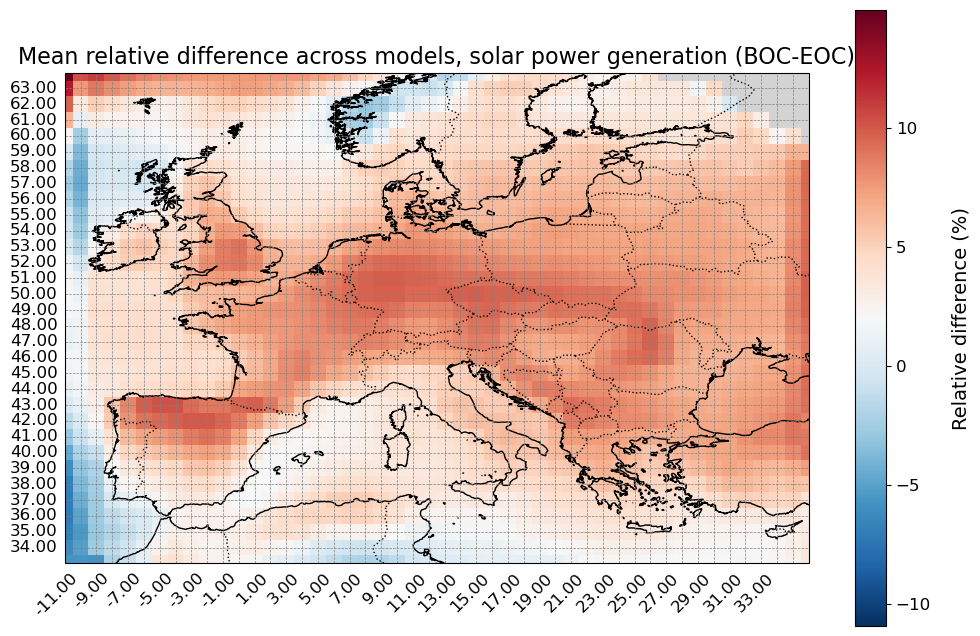

In [4]:
# 1) Compute the multi‐model mean
mean_rel_diff = all_relative_differences_combined.mean(dim="model")

# 2) Plot it with the same color‐limits you set before
from plots import map_plots

map_plots(
    mean_rel_diff,setnan=False,
    cmap='RdBu_r',
    vmin=q05,             # your 0.5th percentile
    vmax=q995,             # your 99.5th percentile
    title="Mean relative difference across models, solar power generation (BOC-EOC)",
    label="Relative difference (%)"
)


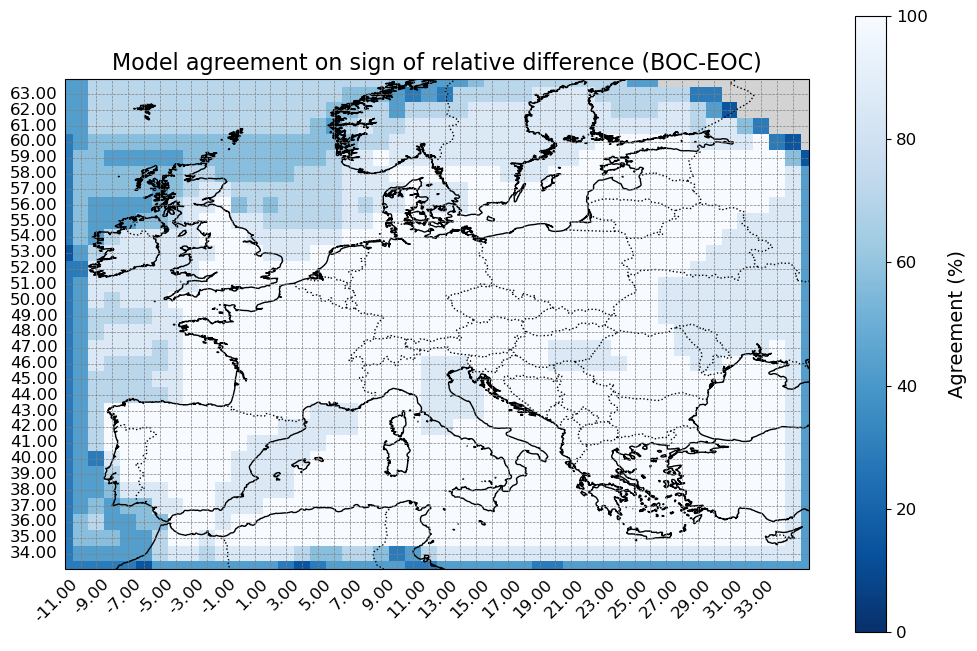

In [7]:
import pandas as pd
import numpy as np
import xarray as xr
from plots import map_plots

models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2",
          "HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]

# 1) Stack all models into one DataArray with a "model" dimension
all_rel = xr.concat(
    [relative_differences[m] for m in models],
    dim=pd.Index(models, name="model")
)

# 2) Ensemble‐mean sign (+1 increase, -1 decrease)
ens_mean   = all_rel.mean(dim="model")
ens_sign   = np.sign(ens_mean)

# 3) Count how many models match that sign
model_signs   = np.sign(all_rel)
agreement_cnt = (model_signs == ens_sign).sum(dim="model")

# 4) Percentage agreement
agreement_pct = agreement_cnt / len(models) * 100

# 5) Plot
map_plots(
    agreement_pct,setnan=True,
    cmap="Blues_r",
    vmin=0, vmax=100,
    title='Model agreement on sign of relative difference (BOC-EOC)',
    label='Agreement (%)'
)


In [37]:
agreement_pct.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(81.52056277)

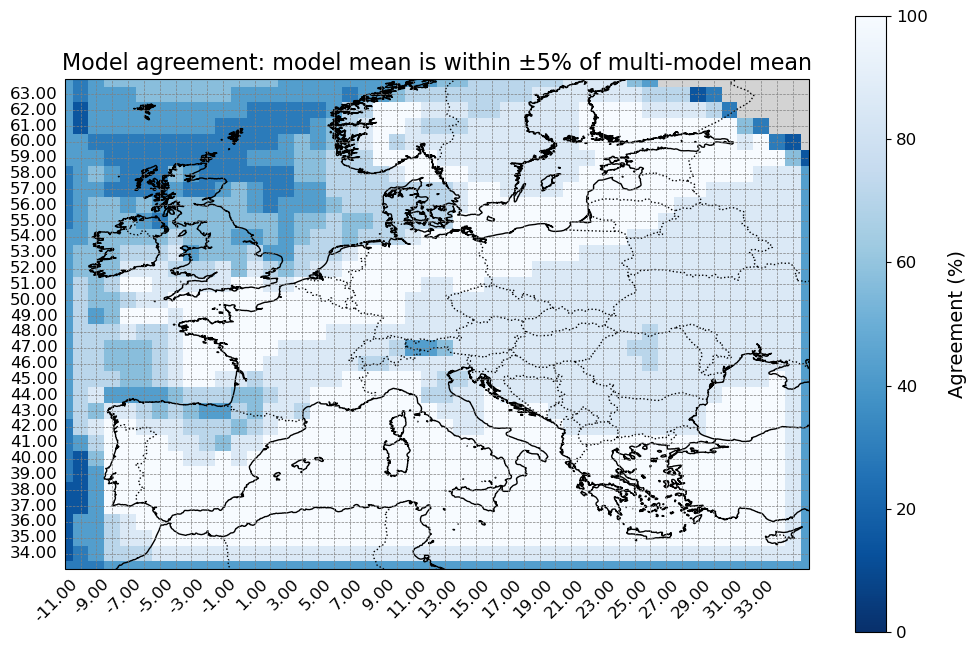

In [8]:
# 1. Stack into one DataArray [model, y, x]
all_rel = xr.concat(
    [relative_differences[m] for m in models],
    dim = pd.Index(models, name="model")
)

# 2. Compute the multi‐model mean
ens_mean = all_rel.mean(dim="model")

# 3. Define your tolerance (e.g. ±5 % absolute difference)
tol = 5.0

# 4. Count how many models fall within ±tol of the mean
within_tol = (np.abs(all_rel - ens_mean) <= tol).sum(dim="model")

# 5. Convert to percent agreement
agreement_mag = within_tol / all_rel.sizes["model"] * 100

# 6. Plot that
map_plots(
    agreement_mag,
    cmap="Blues_r",
    setnan=True,
    vmin=0, vmax=100,
    title=f"Model agreement: model mean is within ±{tol:.0f}% of multi-model mean",
    label="Agreement (%)"
)


In [36]:
agreement_mag.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(76.41594517)

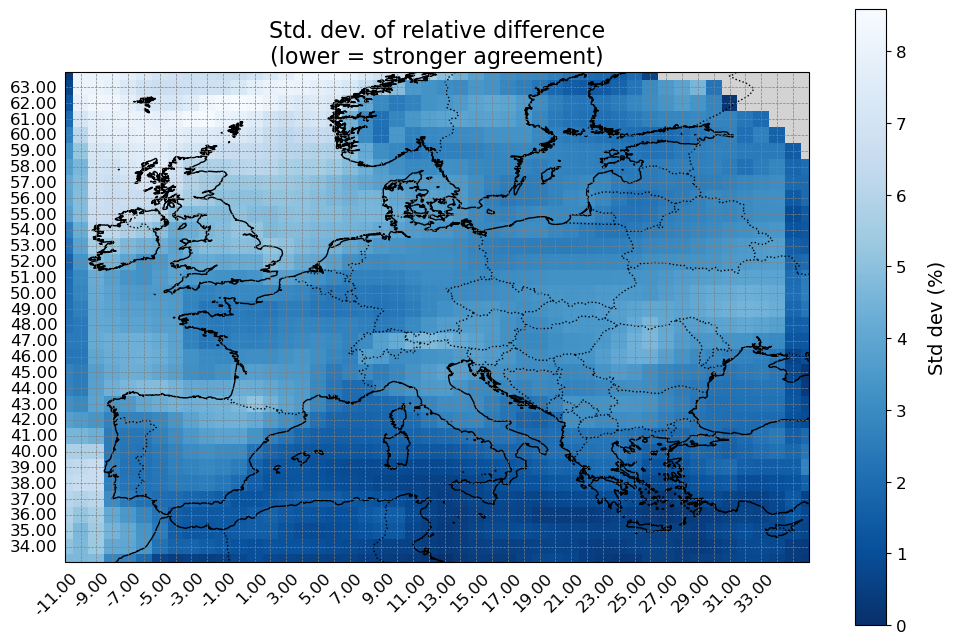

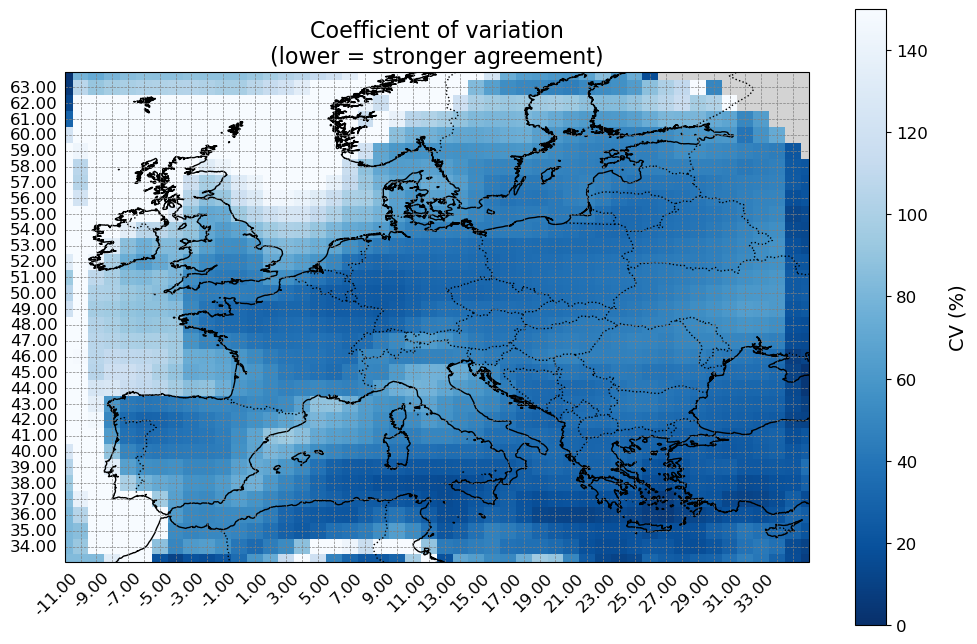

In [11]:
# Standard deviation
std_rel = all_rel.std(dim="model")

map_plots(
    std_rel, setnan=True,
    cmap="Blues_r",
    vmin=0, vmax=std_rel.max(),
    title="Std. dev. of relative difference\n(lower = stronger agreement)",
    label="Std dev (%)"
)

# Or coefficient of variation (std / mean)
cv_rel = std_rel / np.abs(ens_mean) * 100

map_plots(
    cv_rel,
    cmap="Blues_r",setnan=True,
    vmin=0, vmax=150,
    title="Coefficient of variation\n(lower = stronger agreement)",
    label="CV (%)"
)


In [44]:
std_rel.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(3.09257363)

In [46]:
cv_rel.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(150.11016086)

/tmp/ipykernel_95532/1229683076.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap('RdBu_r').copy()


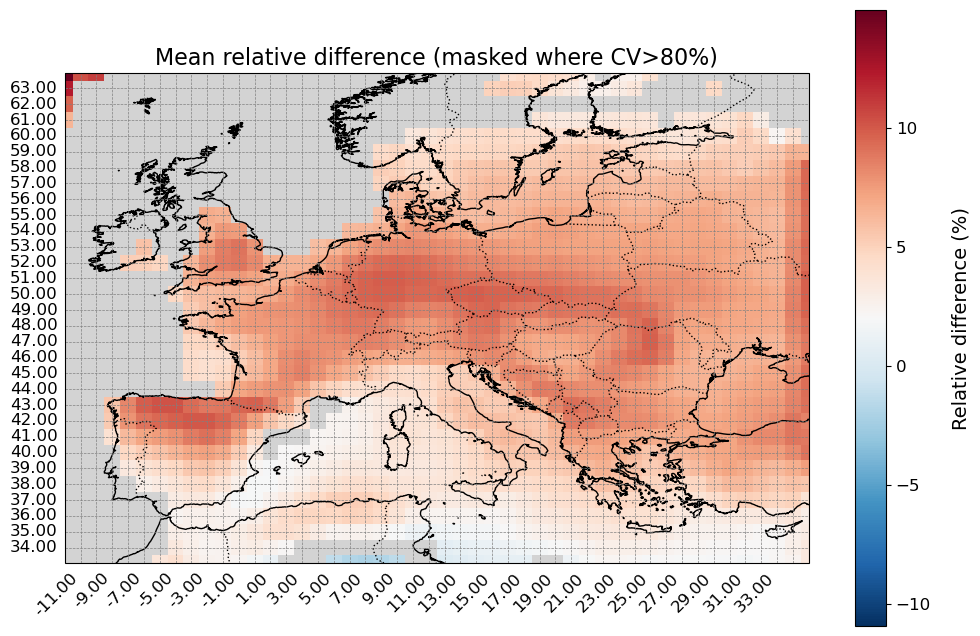

In [12]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from plots import map_plots

# 1) Make a copy of RdBu_r and assign NaNs a grey color
cmap = mpl.cm.get_cmap('RdBu_r').copy()
cmap.set_bad(color='lightgrey')   # or any color that stands out

# 2) Mask out high‐CV cells
masked_mean = mean_rel_diff.where(cv_rel <= 80)

# 3) Plot with that colormap
map_plots(
    masked_mean,setnan=True,
    cmap=cmap,
    vmin=q05, vmax=q995,
    title="Mean relative difference (masked where CV>80%)",
    label="Relative difference (%)"
)



In [38]:
import os
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
from plots import map_plots

# ── USER SETTINGS ─────────────────────────────────────────────────────────────
models   = ["ACCESS-CM2","CanESM5","CMCC-CM2-SR5","CMCC-ESM2",
            "HadGEM3-GC31-LL","HadGEM3-GC31-MM","MRI-ESM2-0"]
base_dir = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power"
tol      = 5.0   # ±5 % for magnitude‐agreement
# ──────────────────────────────────────────────────────────────────────────────

# 1) Load seasonal‐means and compute Δ% per model
rel_diff = {}
for model in models:
    boc_files = [
        os.path.join(base_dir, f"{model}_1x1grid/historical/aggregated_solar_power_seasons_{yr}.nc")
        for yr in range(1980, 2015)
    ]
    eoc_files = [
        os.path.join(base_dir, f"{model}_1x1grid/ssp585/aggregated_solar_power_seasons_{yr}.nc")
        for yr in range(2065, 2100)
    ]
    ds_boc = xr.concat(
        [xr.open_dataset(f).expand_dims(time=[yr]) for yr,f in zip(range(1980,2015), boc_files)],
        dim="time"
    )
    ds_eoc = xr.concat(
        [xr.open_dataset(f).expand_dims(time=[yr]) for yr,f in zip(range(2065,2100), eoc_files)],
        dim="time"
    )
    rel_diff[model] = (ds_eoc.mean("time") - ds_boc.mean("time")) / ds_boc.mean("time") * 100

# 2) Identify seasons
seasons = list(rel_diff[models[0]].data_vars)
print(seasons)

# 2) Create an empty DataFrame to hold the counts
nan_counts = pd.DataFrame(index=models, columns=seasons, dtype=int)

# 3) Fill it in
for model in models:
    ds = rel_diff[model]
    for season in seasons:
        # ds[season] is a DataArray with dims (y, x)
        # count NaNs by summing the boolean mask over both spatial dims
        count_nan = int(ds[season].isnull().sum(dim=['y', 'x']).values)
        nan_counts.at[model, season] = count_nan

import pandas as pd

# seasons and previous nan_counts DataFrame already defined...
# nan_counts: DataFrame indexed by model, columns=seasons

# 1) Compute total grid‐cells per model (each season has the same grid dims)
grid_cells = {}
for model in models:
    ds = rel_diff[model]
    # pick any one season, here 'Winter'
    season = seasons[0]
    ny = ds[season].sizes['y']
    nx = ds[season].sizes['x']
    grid_cells[model] = ny * nx

# 2) Turn into a Series
grid_cells_s = pd.Series(grid_cells, name='total_cells')

# 3) Append to the nan_counts table
full_table = nan_counts.copy()
full_table['total_cells'] = grid_cells_s

print("NaN counts & total grid‐cells per model:")
print(full_table)





['Winter', 'Spring', 'Summer', 'Autumn']
NaN counts & total grid‐cells per model:
                 Winter  Spring  Summer  Autumn  total_cells
ACCESS-CM2        550.0   550.0   550.0   550.0         1920
CanESM5           667.0   667.0   667.0   667.0         1920
CMCC-CM2-SR5      385.0   385.0   385.0   385.0         1920
CMCC-ESM2         385.0   385.0   385.0   385.0         1920
HadGEM3-GC31-LL   550.0   550.0   550.0   550.0         1920
HadGEM3-GC31-MM   379.0   379.0   379.0   379.0         1920
MRI-ESM2-0        516.0   516.0   516.0   516.0         1920


/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunct

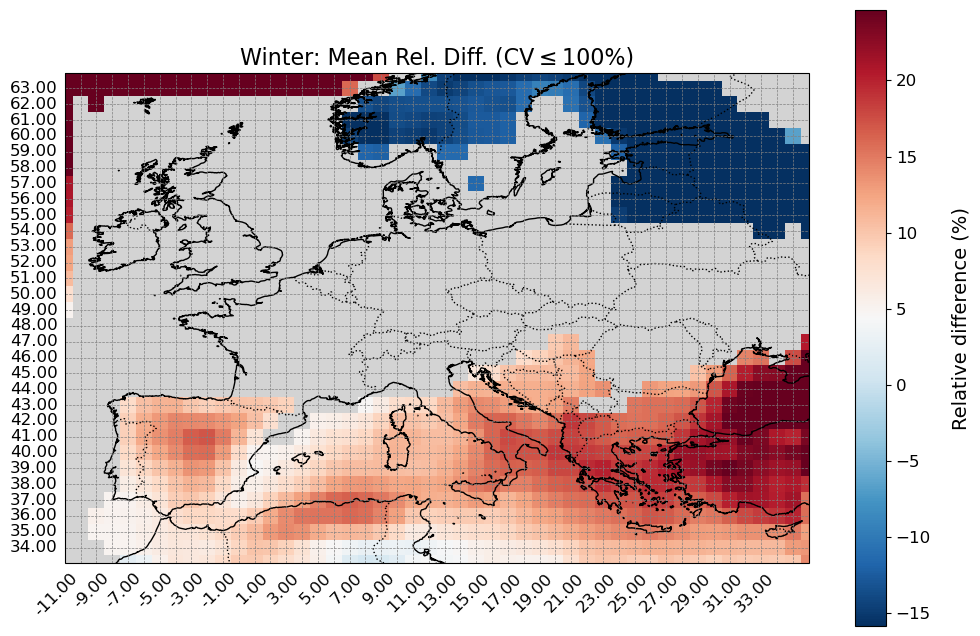

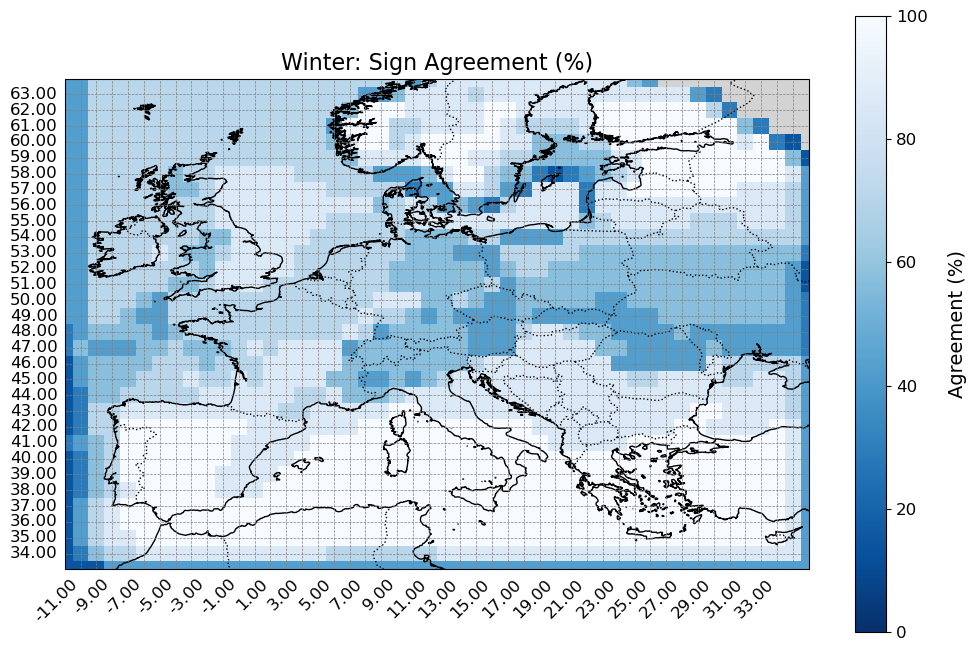

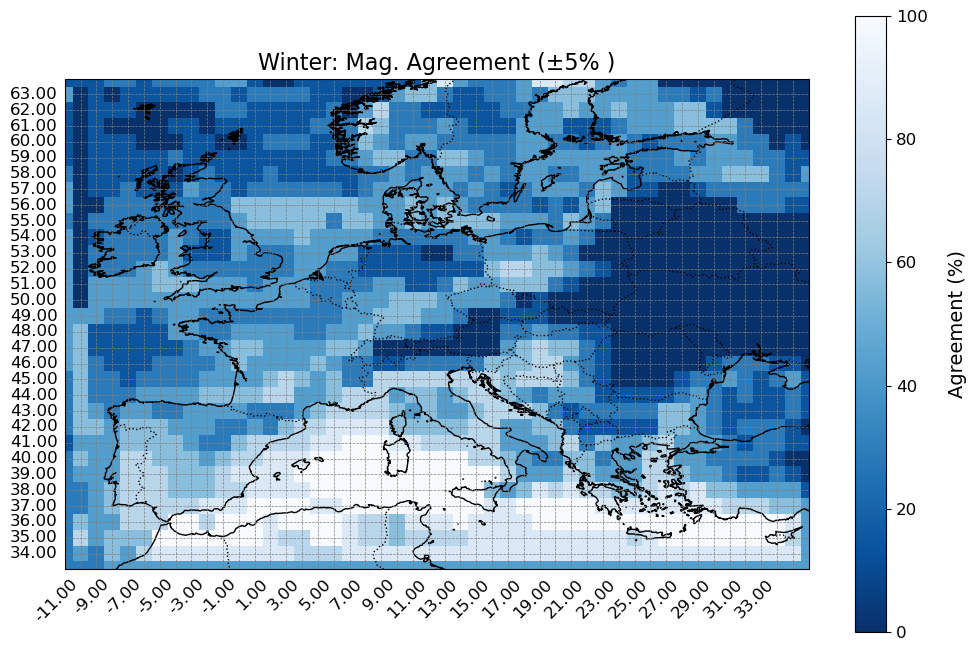

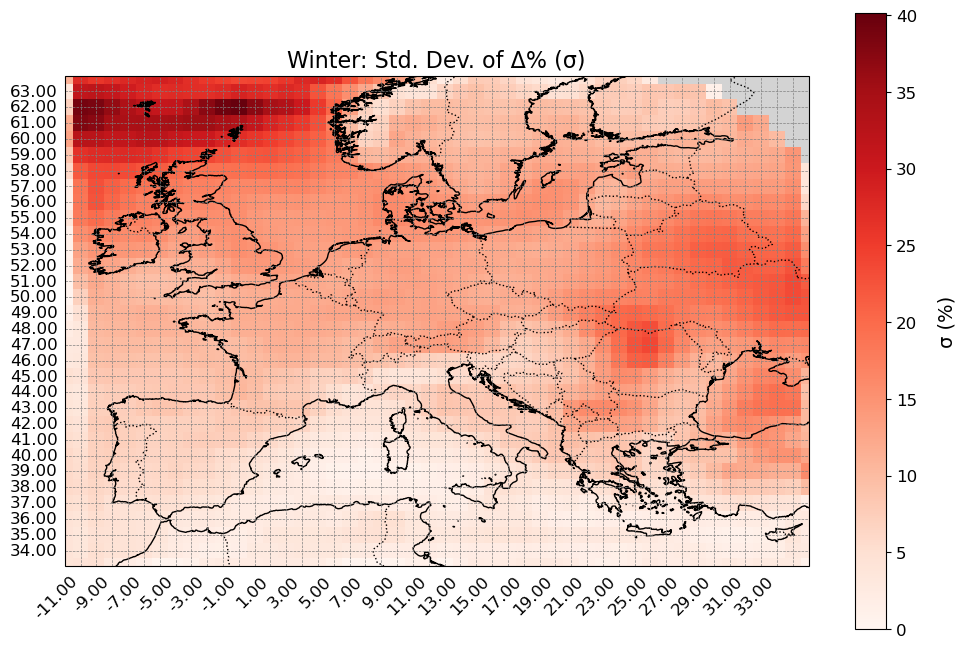

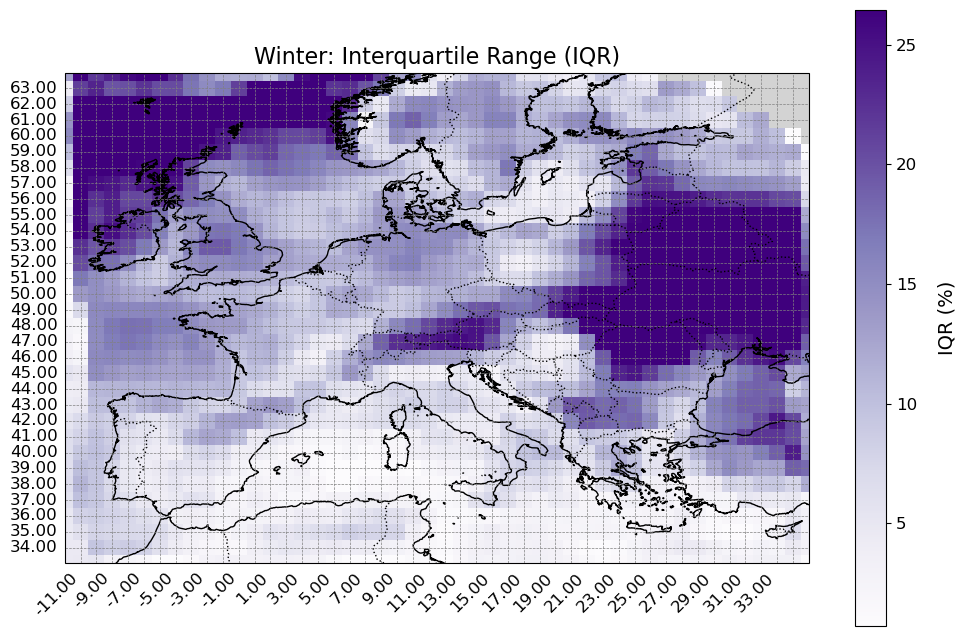

...

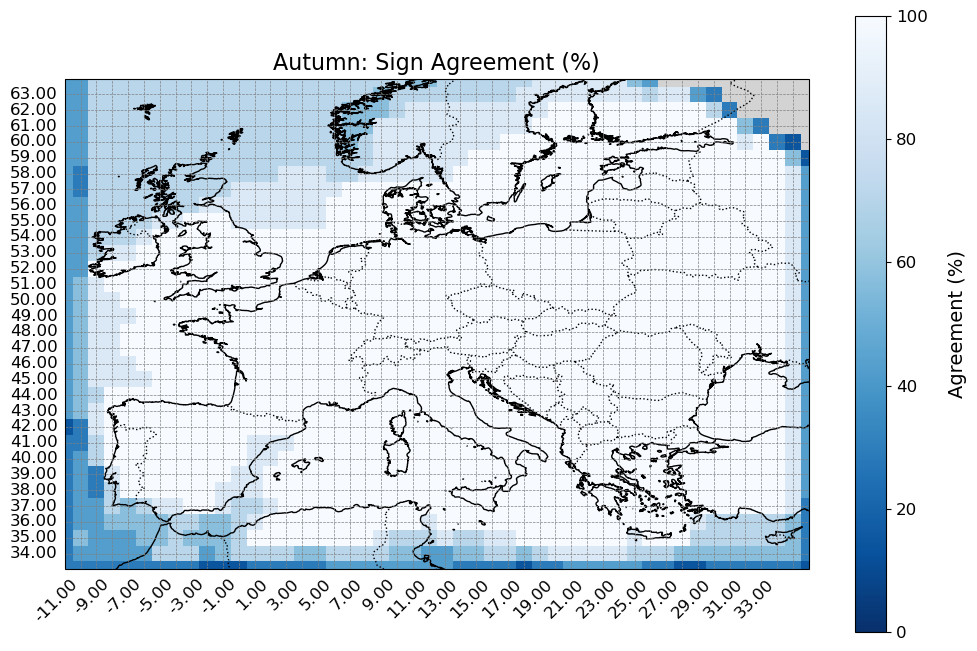

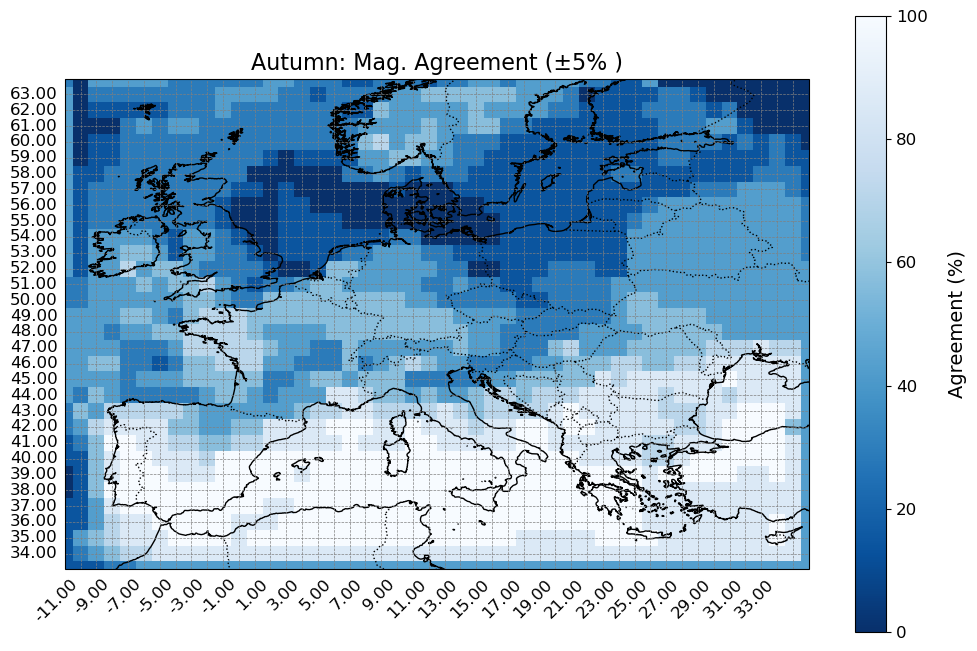

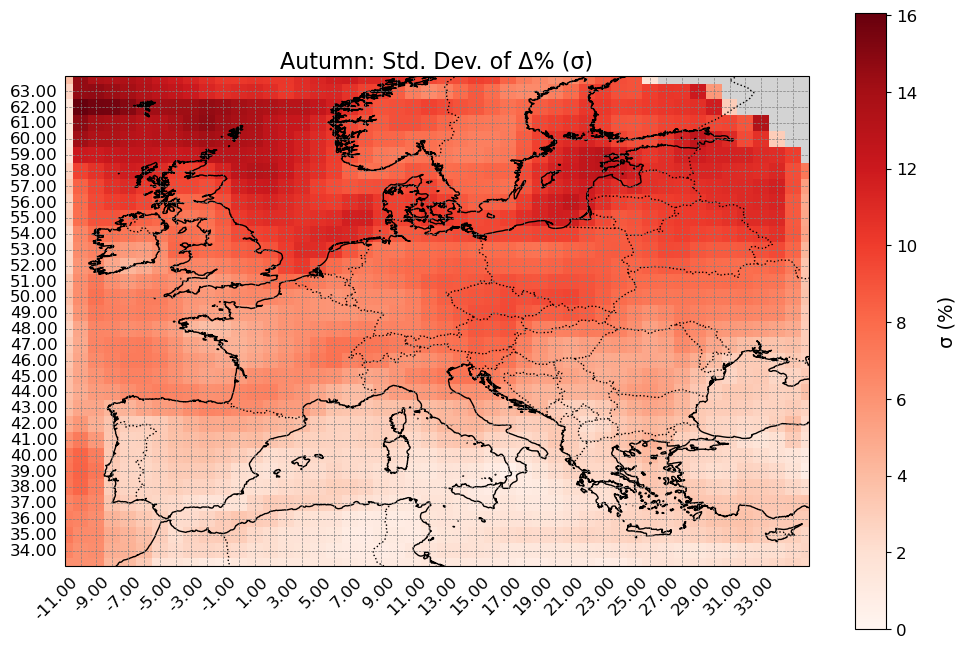

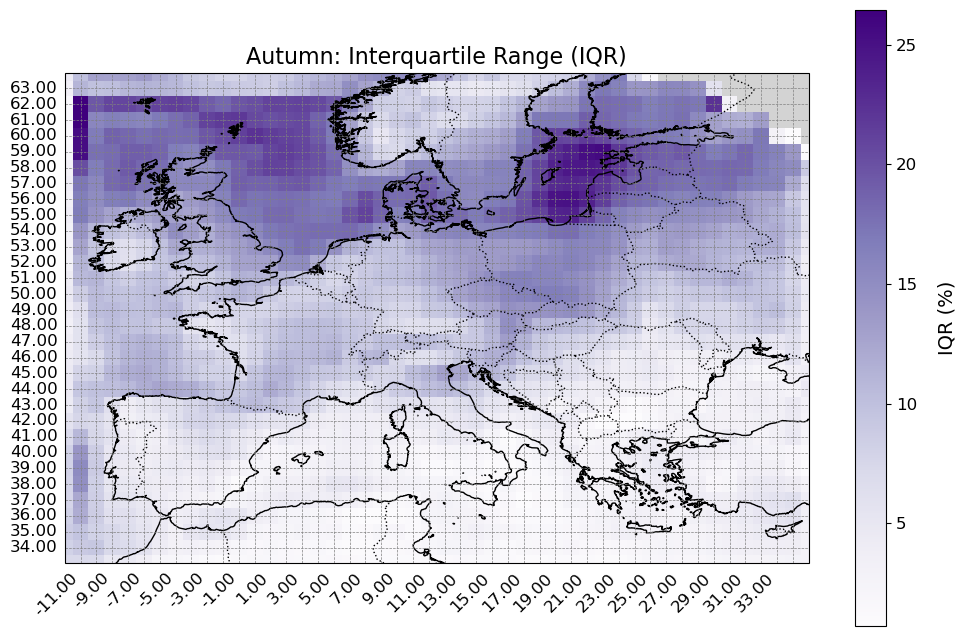

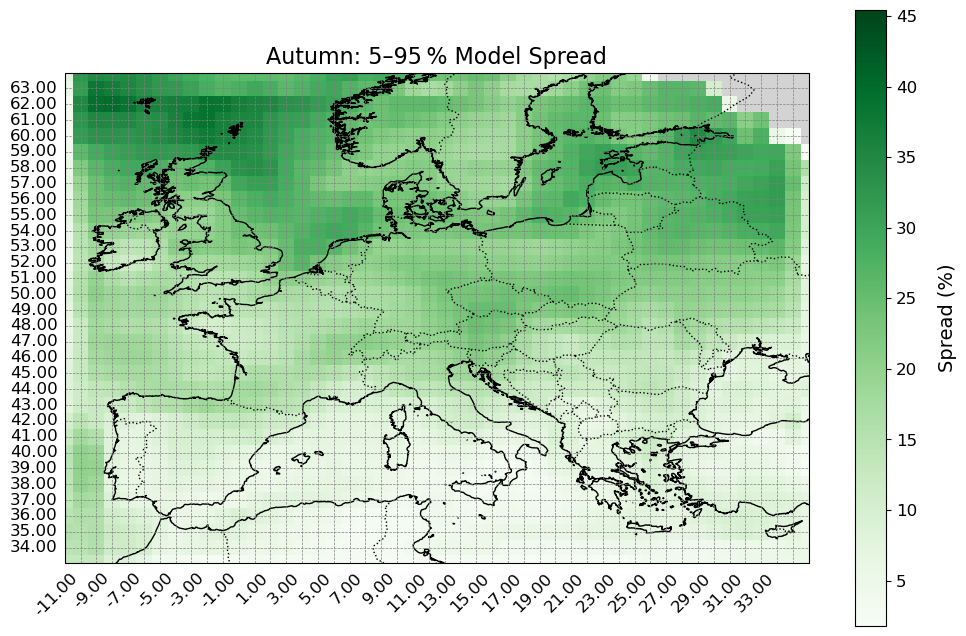

In [44]:
import os
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
from plots import map_plots

# ── USER SETTINGS ─────────────────────────────────────────────────────────────
models   = ["ACCESS-CM2","CanESM5","CMCC-CM2-SR5","CMCC-ESM2",
            "HadGEM3-GC31-LL","HadGEM3-GC31-MM","MRI-ESM2-0"]
seasons  = ['Winter','Spring','Summer','Autumn']
tol      = 5.0   # ±5 % for magnitude‐agreement
# ──────────────────────────────────────────────────────────────────────────────

# 1) Compute metrics per season (including IQR & wide spread)
ens_mean    = {}
sign_agree  = {}
mag_agree   = {}
std_dev     = {}
cv          = {}
iqr         = {}
wide_spread = {}

for season in seasons:
    # stack models along a new "model" dim
    all_rel = xr.concat(
        [rel_diff[m][season] for m in models],
        dim=pd.Index(models, name="model")
    )

    # ensemble mean and sign agreement
    ens_mean[season]   = all_rel.mean("model")
    model_signs        = np.sign(all_rel)
    ens_sign           = np.sign(ens_mean[season])
    sign_agree[season] = (model_signs == ens_sign).sum("model") / len(models) * 100

    # magnitude agreement and spread
    mag_agree[season]  = (np.abs(all_rel - ens_mean[season]) <= tol).sum("model") / len(models) * 100
    std_dev[season]    = all_rel.std("model")
    cv[season]         = std_dev[season] / np.abs(ens_mean[season]) * 100

    # interquartile range (IQR)
    q25 = all_rel.quantile(0.25, dim="model")
    q75 = all_rel.quantile(0.75, dim="model")
    iqr[season] = q75 - q25

    # wide 5–95 % spread
    p05, p95 = all_rel.quantile([0.05, 0.95], dim="model")
    wide_spread[season] = p95 - p05

# 2) Mask mean Δ% where CV>100%
masked_means = {
    season: ens_mean[season].where(cv[season] <= 100)
    for season in seasons
}

# 3) Compute common color‐limits
#    a) for masked means
stacked_mean = xr.concat(list(masked_means.values()), dim="season")
vmin_mean, vmax_mean = np.nanpercentile(stacked_mean.values, [3, 97])
#    b) for IQR
stacked_iqr  = xr.concat(list(iqr.values()), dim="season")
vmin_iqr, vmax_iqr = np.nanpercentile(stacked_iqr.values, [3, 97])
#    c) for wide spread
stacked_ws   = xr.concat(list(wide_spread.values()), dim="season")
vmin_ws, vmax_ws   = np.nanpercentile(stacked_ws.values, [3, 97])

# 4) Prepare a “bad data” colormap for masking
cmap_bad = mpl.cm.get_cmap("RdBu_r").copy()
cmap_bad.set_bad("lightgrey")

# 5) Plot everything per season
for season in seasons:
    # Mean Δ% (masked)
    map_plots(
        masked_means[season],
        setnan=True,
        cmap=cmap_bad,
        vmin=vmin_mean, vmax=vmax_mean,
        title=f"{season}: Mean Rel. Diff. (CV ≤ 100%)",
        label="Relative difference (%)"
    )

    # Sign agreement
    map_plots(
        sign_agree[season],
        setnan=True,
        cmap="Blues_r",
        vmin=0, vmax=100,
        title=f"{season}: Sign Agreement (%)",
        label="Agreement (%)"
    )

    # Magnitude agreement
    map_plots(
        mag_agree[season],
        setnan=False,
        cmap="Blues_r",
        vmin=0, vmax=100,
        title=f"{season}: Mag. Agreement (±{tol:.0f}% )",
        label="Agreement (%)"
    )

    # Standard deviation
    map_plots(
        std_dev[season],
        setnan=True,
        cmap="Reds",
        vmin=0, vmax=float(std_dev[season].max()),
        title=f"{season}: Std. Dev. of Δ% (σ)",
        label="σ (%)"
    )

    # IQR
    map_plots(
        iqr[season],
        setnan=False,
        cmap="Purples",
        vmin=vmin_iqr, vmax=vmax_iqr,
        title=f"{season}: Interquartile Range (IQR)",
        label="IQR (%)"
    )

    # Wide 5–95% spread
    map_plots(
        wide_spread[season],
        setnan=False,
        cmap="Greens",
        vmin=vmin_ws, vmax=vmax_ws,
        title=f"{season}: 5–95 % Model Spread",
        label="Spread (%)"
    )



In [5]:
import os
import numpy as np
import xarray as xr
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import box

import matplotlib as mpl
# ─────────────────────────────────────────────────────────────────────────────
# 1) PARAMETERS
models = [
    "ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2",
    "HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"
]
diri = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"

# ─────────────────────────────────────────────────────────────────────────────
# 2) LOAD + COMPUTE GRID-CELL RELATIVE DIFFERENCES
relative_differences = {}
all_rel = []

for model in models:
    # historical
    boc = xr.concat([
        xr.open_dataset(os.path.join(diri, f"{model}_1x1grid/historical/aggregated_solar_power_{yr}.nc"))
          .expand_dims(time=[yr])
        for yr in range(1980, 2015)
    ], dim="time")
    mean_boc = boc["specific generation"].mean(dim="time")
    
    # future
    eoc = xr.concat([
        xr.open_dataset(os.path.join(diri, f"{model}_1x1grid/ssp585/aggregated_solar_power_{yr}.nc"))
          .expand_dims(time=[yr])
        for yr in range(2065, 2100)
    ], dim="time")
    mean_eoc = eoc["specific generation"].mean(dim="time")
    
    # percent change + subset
    rel = (mean_eoc - mean_boc) / mean_boc * 100
    rel = rel.sel(x=slice(-12, 35), y=slice(33, 65))
    
    relative_differences[model] = rel
    all_rel.append(rel)

# ─────────────────────────────────────────────────────────────────────────────
# 3) GLOBAL COLOR SCALE
ensemble_grid = xr.concat(list(relative_differences.values()), dim="model").mean(dim="model")

all_stack = xr.concat(all_rel, dim="model")
#q05, q995 = np.nanpercentile(all_stack.values, [0.5, 99.5])
q05, q995 = np.nanpercentile(ensemble_grid.values.flatten(), [0.5, 99.5])

# ─────────────────────────────────────────────────────────────────────────────
# 4) LOAD HIGH-RES SHAPEFILE
ne_50m = "https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_countries.zip"
world = gpd.read_file(ne_50m).to_crs("EPSG:4326")

# ─────────────────────────────────────────────────────────────────────────────
# 5) GRID → COUNTRY
country_dfs = []
for model, da in relative_differences.items():
    df = da.to_dataframe(name="rel_diff").reset_index().dropna(subset=["rel_diff"])
    gdf = gpd.GeoDataFrame(df,
                           geometry=gpd.points_from_xy(df.x, df.y),
                           crs="EPSG:4326")
    joined = gpd.sjoin(
        gdf,
        world[["NAME_LONG", "geometry"]],
        how="inner",
        predicate="within"
    )
    ctr = (joined.groupby("NAME_LONG")["rel_diff"]
                  .mean()
                  .reset_index()
                  .rename(columns={"rel_diff": "mean_rel_diff"}))
    ctr["model"] = model
    country_dfs.append(ctr)

country_summary_df = pd.concat(country_dfs, ignore_index=True)
country_pivot = country_summary_df.pivot(
    index="NAME_LONG", columns="model", values="mean_rel_diff"
)

# ─────────────────────────────────────────────────────────────────────────────
# 6) ENSEMBLE MEAN & CLIP
ensemble = country_pivot.mean(axis=1)
world["ensemble_mean"] = world["NAME_LONG"].map(ensemble)

region_bbox = box(-12, 33, 35, 65)
world_region = gpd.clip(world, region_bbox)


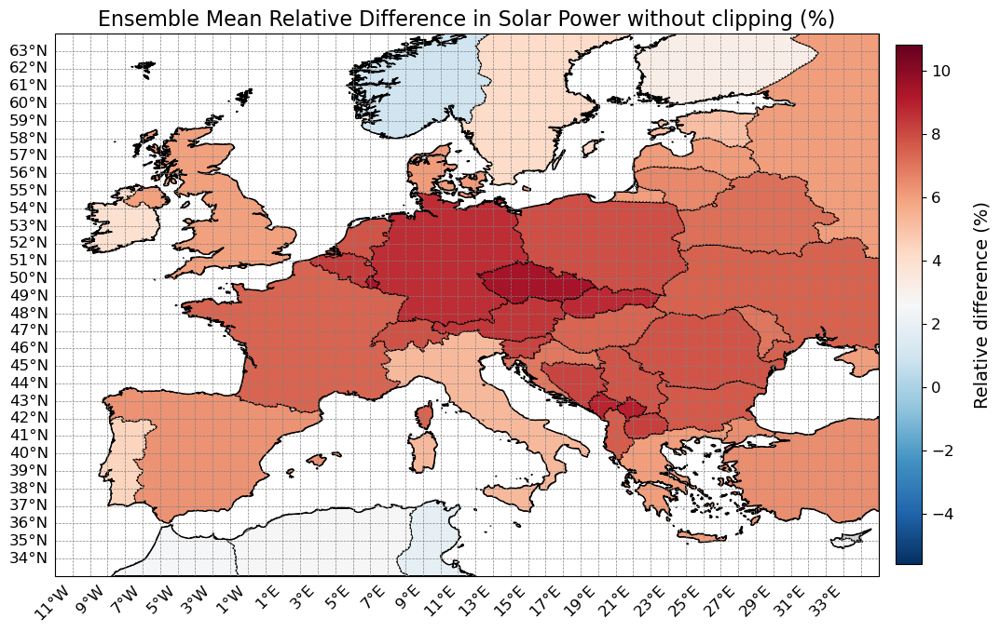

In [8]:
from plots import country_plots
q05, q995 = np.nanpercentile(ensemble_grid.values.flatten(), [0.5, 99.5])
q0,q100 = np.nanpercentile(ensemble_grid.values, [0, 100])
vmin, vmax = q05,q995
country_plots(
    world_region,
    cmap='RdBu_r',
    vmin=vmin,
    vmax=vmax,
    title="Ensemble Mean Relative Difference in Solar Power without clipping (%)",
    label="Relative difference (%)",
    df_column='ensemble_mean'
)
